# Defining notebook settings

Configuration of the test design

In [1]:
# 'Detection' or 'Classification' of erosion
prediction_strategy = 'Detection'

# Train and test the models by stratified kfold
perform_stratified_kfold = True
# Train and test the models by file
perform_kfold_byfile = True

# Rendering boxplots for preliminary exploration is enabled
boxplot_renders = True
# Redering of scans before modelling is enabled
premodeling_renders = True
# Redering of scans after modelling is enabled
postmodeling_renders = False

In [2]:
# Depth range for rendering
min_renderdepth, max_renderdepth = {
    'raw': (50, 400),
    'smoothed': (-0.5, 0.5),
    'smoothed and alligned': (-0.5, 0.5)
}['smoothed']

Annotations for the erosion

In [3]:
annotations = {
    '6_flight_vibr_orig_binary.ply': {
        (280, 560): 3,
        (590, 640): 2,
        (660, 700): 2,
        (740, 810): 2,
        (960, 1010): 2,
        (1140, 1200): 2,
        (1230, 1280): 2,
        (1380, 1400): 2,
        (1450, 1470): 2,
    },
    '221111_144114__binary_onlylines25660to28100 rloess 0.09.ply': {
        (200, 530): 3,
        (590, 660): 2,
        (680, 740): 2,
        (790, 880): 2,
        (1080, 1110): 2,
        (1270, 1330): 2,
        (1380, 1430): 2,
        (1560, 1580): 2,
        (1660, 1700): 2,
    },
    '221111_144114__binary_onlylines47178to50517 rloess 0.09.ply': {
        (2550, 3060): 3,
        (2400, 2480): 2,
        (2350, 2370): 2,
        (2270, 2300): 2,
        (1860, 1900): 2,
        (1540, 1620): 2,
        (1400, 1450): 2,
        (1170, 1200): 2,
        (1070, 1100): 2,
    },'221111_144114__binary_onlylines86841to90142 rloess 0.09.ply': {
        (240, 640): 3,
        (730, 800): 2,
        (840, 910): 2,
        (950, 1080): 2,
        (1340, 1420): 2,
        (1670, 1740): 2,
        (1820, 1890): 2,
        (2130, 2170): 2,
        (2240, 2270): 2,
    },
    '221111_144114__binary_onlylines114378to117271 rloess 0.09.ply': {
        (2130, 2630): 3,
        (1920, 2010): 2,
        (1790, 1890): 2,
        (1610, 1750): 2,
        (1310, 1380): 2,
        (1110, 1160): 2,
        (1010, 1050): 2,
        (860, 890): 2,
        (770, 800): 2,
    }
}

# Importing necessary libraries

These are third-party libraries that we used.

In [4]:
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import tensorflow as tf

from statistics import mean

import os
import open3d as o3d

from sklearn.model_selection import train_test_split
from sklearn.model_selection import StratifiedKFold

2025-02-19 03:28:53.559460: I tensorflow/core/util/port.cc:153] oneDNN custom operations are on. You may see slightly different numerical results due to floating-point round-off errors from different computation orders. To turn them off, set the environment variable `TF_ENABLE_ONEDNN_OPTS=0`.
2025-02-19 03:28:53.683694: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:477] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
E0000 00:00:1739935733.733986    1038 cuda_dnn.cc:8310] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
E0000 00:00:1739935733.750745    1038 cuda_blas.cc:1418] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
2025-02-19 03:28:53.867261: I tensorflow/core/platform/cpu_feature_guard.cc:210] This TensorFlow binary is optimized to use available CPU instr

Jupyter environment detected. Enabling Open3D WebVisualizer.
[Open3D INFO] WebRTC GUI backend enabled.
[Open3D INFO] WebRTCWindowSystem: HTTP handshake server disabled.


# Helper functions

A function for rendering an anotation of erosion onto a scatter plot

In [5]:
def annotation_line(ax, xmin, xmax, y, text, ytext = 0, linecolor = 'red', linewidth = 1, fontsize = 12):
    ax.annotate('',
                xy=(xmin, y),
                xytext=(xmax, y),
                xycoords='data',
                textcoords='data',
                arrowprops={'arrowstyle': '|-|',
                            'color': linecolor, 
                            'linewidth':linewidth
                           }
               )
    
    ax.annotate('', 
                xy=(xmin, y), 
                xytext=(xmax, y), 
                xycoords='data', 
                textcoords='data',
                arrowprops={'arrowstyle': '<->', 
                            'color': linecolor, 
                            'linewidth':linewidth
                           }
               )

    xcenter = xmin + (xmax - xmin) / 2
    
    if ytext == 0:
        ytext = y + (ax.get_ylim()[1] - ax.get_ylim()[0]) / 2

    ax.annotate(text, xy=(xcenter,ytext), ha='center', va='center', fontsize=fontsize)

A function to pad to a list to given length with given values

In [6]:
def pad_list_to_length_with(a, N, x = 0):
    return a + [x] * (N - len(a))

A function to get errosion class at a given x coordinate in a given scan. Erosion classes are based on annotations (See above).

In [7]:
def get_class_by_x(x, file_name):
    for (start, end), label in annotations[file_name].items():
        if x >= start and x <= end:
            return (1 if prediction_strategy == "Detection" else label)
    return 0

# Reading the data
Loading PLY files with `open3d`. `open3d` is optimized for handling `.ply` files efficiently. Takes around a minute. There are 3 coordinates (x, y and z) and 22.7 million rows in total.

In [8]:
# Load PLY file names
ply_file_names = os.listdir('.')

# Load PLY files
ply_files = [filename for filename in ply_file_names if filename.endswith(".ply")]

# Load point clouds from PLY files and convert them to numpy arrays
point_clouds = [np.asarray(o3d.io.read_point_cloud(ply_file).points).T for ply_file in ply_files]
num_of_clouds = len(point_clouds)
print(f"Loaded {num_of_clouds} point clouds.")

total_rows = 0
for i in range(num_of_clouds):
    print(f"Point cloud {ply_file_names[i]} shape: {point_clouds[i].shape}")
    total_rows += point_clouds[i].shape[1]
print(f"Total number of rows: {total_rows}")

Loaded 5 point clouds.
Point cloud 221111_144114__binary_onlylines114378to117271 rloess 0.09.ply shape: (3, 5543323)
Point cloud 221111_144114__binary_onlylines25660to28100 rloess 0.09.ply shape: (3, 3534402)
Point cloud 221111_144114__binary_onlylines47178to50517 rloess 0.09.ply shape: (3, 3414425)
Point cloud 221111_144114__binary_onlylines86841to90142 rloess 0.09.ply shape: (3, 4718054)
Point cloud 6_flight_vibr_orig_binary.ply shape: (3, 5506560)
Total number of rows: 22716764


*6_flight_vibr_orig_binary.ply* has 1.7 million rows indicating a missed measurement or no signal. 

In [9]:
total_missing_rows = 0
for i in range(num_of_clouds):
    missing_rows = np.sum(point_clouds[i][2] == 0)
    print(f"Rows with missing measurement in {ply_file_names[i]}: {missing_rows}")
    total_missing_rows += missing_rows
print(f"Total number of rows with missing measurement: {total_missing_rows}")

Rows with missing measurement in 221111_144114__binary_onlylines114378to117271 rloess 0.09.ply: 0
Rows with missing measurement in 221111_144114__binary_onlylines25660to28100 rloess 0.09.ply: 0
Rows with missing measurement in 221111_144114__binary_onlylines47178to50517 rloess 0.09.ply: 0
Rows with missing measurement in 221111_144114__binary_onlylines86841to90142 rloess 0.09.ply: 0
Rows with missing measurement in 6_flight_vibr_orig_binary.ply: 1725869
Total number of rows with missing measurement: 1725869


These are measurements we want to delete. They don't have value to use and they will only act as (sever) noise to our machine learning models later on.

In [10]:
total_rows = 0
for i in range(num_of_clouds):
    # Find indices of points with missing z coordinate
    z_zero_indices = np.where(point_clouds[i][2] == 0)[0]

    # Delete points with missing measurment
    point_clouds[i] = np.delete(point_clouds[i], z_zero_indices, axis=1)

    print(f"Point cloud {ply_file_names[i]} shape: {point_clouds[i].shape}")
    total_rows += point_clouds[i].shape[1]
print(f"Total number of rows: {total_rows}")

Point cloud 221111_144114__binary_onlylines114378to117271 rloess 0.09.ply shape: (3, 5543323)
Point cloud 221111_144114__binary_onlylines25660to28100 rloess 0.09.ply shape: (3, 3534402)
Point cloud 221111_144114__binary_onlylines47178to50517 rloess 0.09.ply shape: (3, 3414425)
Point cloud 221111_144114__binary_onlylines86841to90142 rloess 0.09.ply shape: (3, 4718054)
Point cloud 6_flight_vibr_orig_binary.ply shape: (3, 3780691)
Total number of rows: 20990895


# Preliminary exploration

Let's create a few plots to look at our data and how it is distributed.

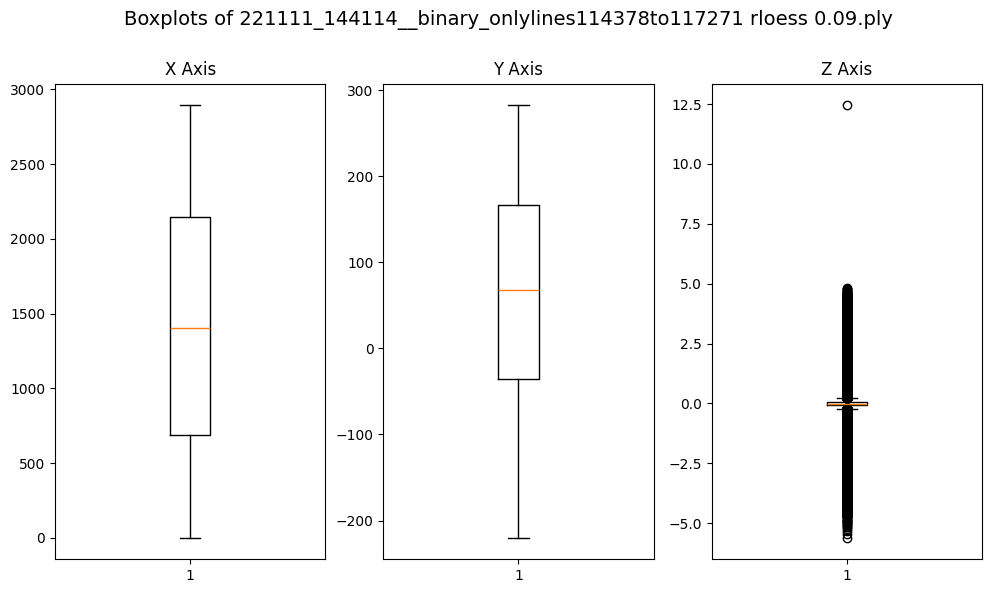

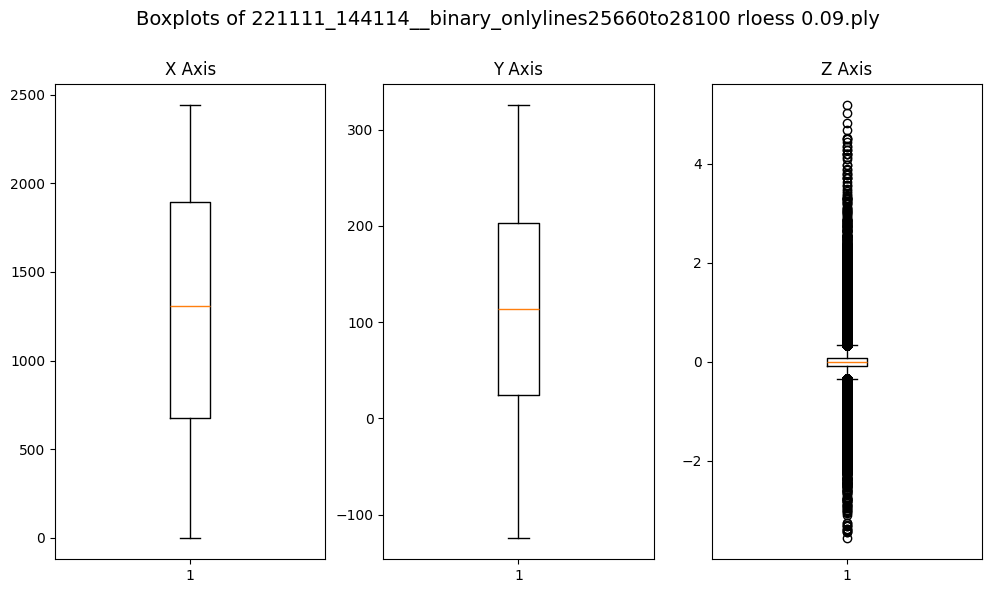

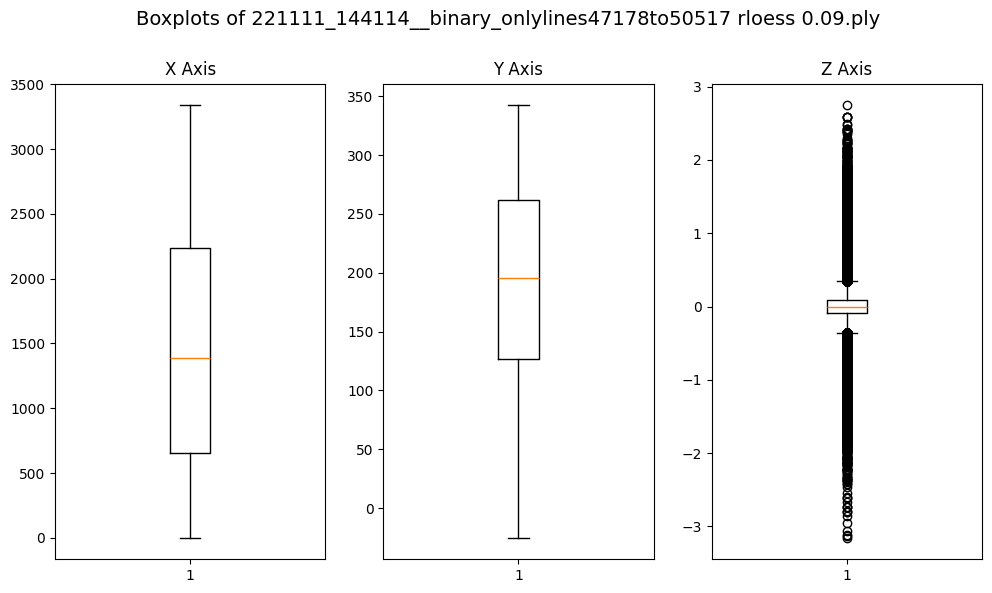

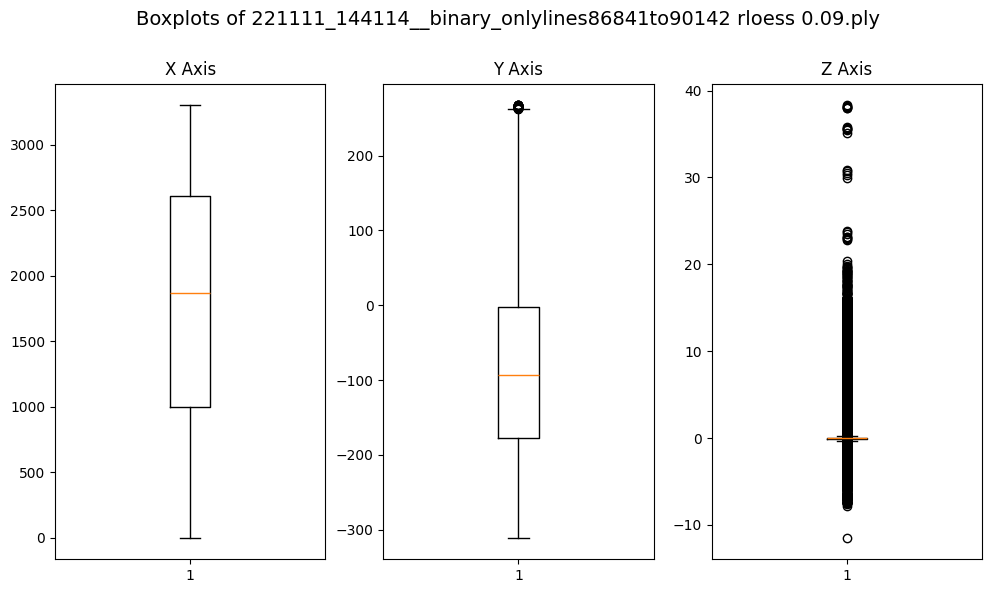

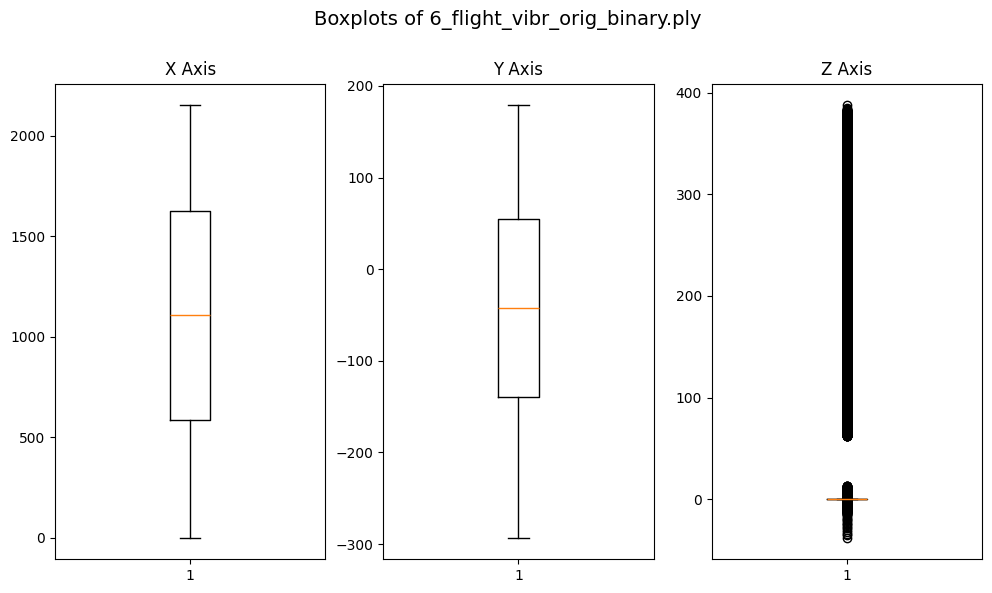

In [11]:
if (boxplot_renders):
    for i in range(num_of_clouds):
        fig, axs = plt.subplots(1, 3, figsize=(10,6))

        fig.suptitle('Boxplots of ' + ply_file_names[i], fontsize=14)
        plt.tight_layout(rect=[0, 0, 1, 0.95])

        axs[0].boxplot(point_clouds[i][0])
        axs[0].set_title('X Axis')

        axs[1].boxplot(point_clouds[i][1])
        axs[1].set_title('Y Axis')

        axs[2].boxplot(point_clouds[i][2])
        axs[2].set_title('Z Axis')
        plt.show()
else:
    print("Boxplot rendering is disabled.")

Let's render the pointclouds. Can take several minutes.

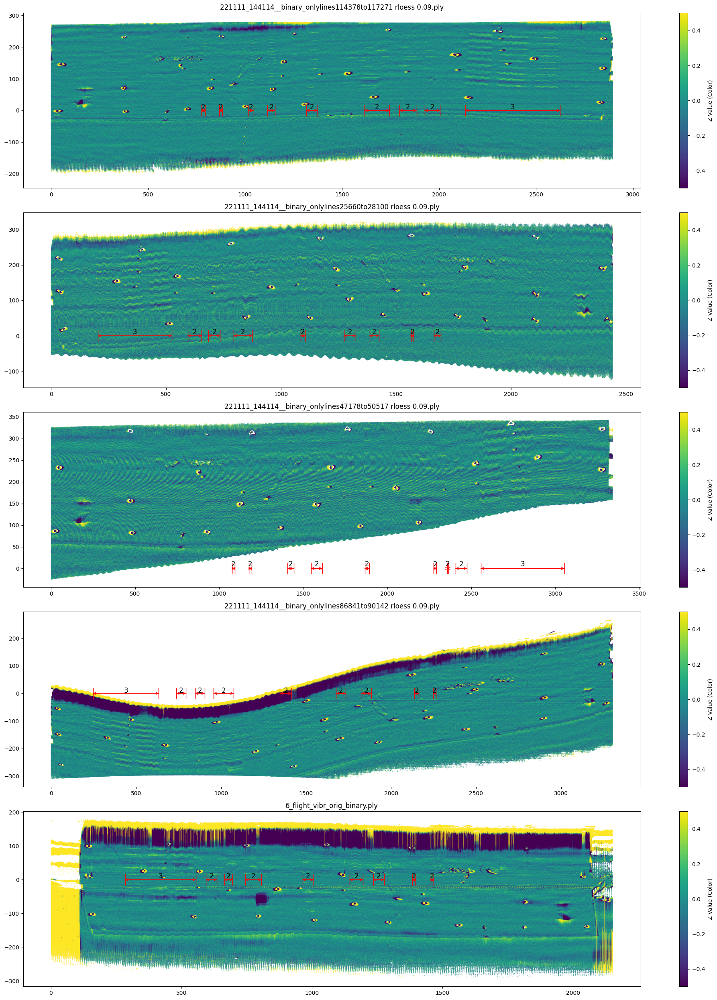

In [12]:
# Create subplots for each point cloud
if(premodeling_renders):
    fig, axes = plt.subplots(num_of_clouds, 1, figsize=(20, 5*num_of_clouds))

    # If there's only one point cloud, wrap axes in a list
    if num_of_clouds == 1:
        axes = [axes]

    # Loop through each point cloud and plot it in a separate subplot
    for i, pointcloud in enumerate(point_clouds):
        # Unpack x, y, z coordinates
        x, y, z = pointcloud  
        
        # Scatter plot of the point cloud
        sc = axes[i].scatter(x, y, c=z, s=0.01, vmin=min_renderdepth, vmax=max_renderdepth)
        axes[i].set_title(ply_file_names[i])

        # Adding annotations
        if ply_file_names[i] in annotations:
            for (start, end), label in annotations[ply_file_names[i]].items():
                annotation_line(axes[i], start, end, 0, label, ytext = 10)

        # Add colorbar for each subplot
        cbar = plt.colorbar(sc, ax=axes[i])
        cbar.set_label("Z Value (Color)")

    # Adjust layout for better spacing
    plt.tight_layout()
    plt.show()
else:
    print("Rendering of scans before modelling is disabled.")

# Padding
Every unique X coordinate should have the same number of points to ensure that every future slice has the same rectangular shape.
Finding largest range on Y axis.

Created 5 matrices.
Matrix shape: (15710, 2894)
Matrix shape: (15710, 2440)
Matrix shape: (15710, 3340)
Matrix shape: (15710, 3302)
Matrix shape: (15710, 2151)


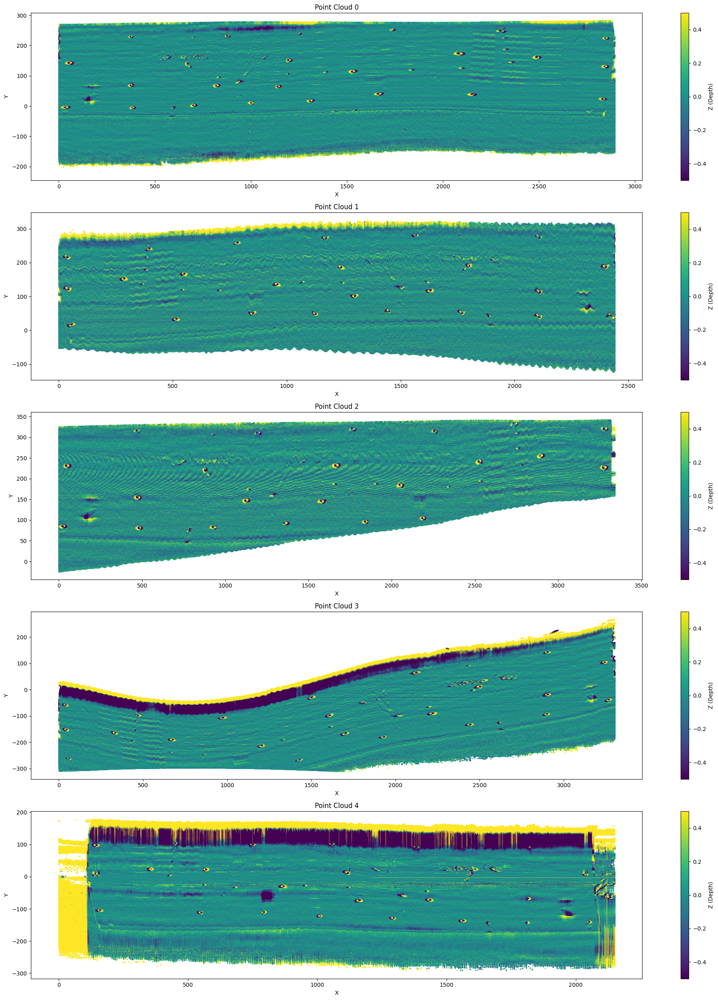

In [13]:
"""
Converts a list of point clouds into aligned matrices for CNN input.

Args:
    point_clouds (list): A list of point clouds, where each point cloud is a tuple of (X, Y, Z).

Returns:
    list: A list of 2D numpy arrays representing the aligned point cloud matrices.
"""
# Collect all unique Y values from all point clouds
all_y_values = set()
for _, Y, _ in point_clouds:
    all_y_values.update(Y)

# Sort Y values to create a consistent grid
sorted_y_values = np.array(sorted(all_y_values))

matrices = []

for X, Y, Z in point_clouds:
    # Create a mapping of (X, Y) -> Z values
    point_dict = {(x, y): z for x, y, z in zip(X, Y, Z)}
    
    # Get unique X values for matrix width
    unique_x_values = sorted(set(X))
    x_to_idx = {x: i for i, x in enumerate(unique_x_values)}
    
    # Create an empty matrix filled with zeros
    matrix = np.full((len(sorted_y_values), len(unique_x_values)), 100, dtype=np.float32)
    
    # Fill the matrix with Z values
    for (x, y), z in point_dict.items():
        row_idx = np.searchsorted(sorted_y_values, y)
        col_idx = x_to_idx[x]
        matrix[row_idx, col_idx] = z
    
    matrices.append(matrix)


print(f"Created {len(matrices)} matrices.")
print(f"Matrix shape: {matrices[0].shape}")
print(f"Matrix shape: {matrices[1].shape}")
print(f"Matrix shape: {matrices[2].shape}")
print(f"Matrix shape: {matrices[3].shape}")
print(f"Matrix shape: {matrices[4].shape}")

num_matrices = len(matrices)
fig, axes = plt.subplots(num_matrices, 1, figsize=(20, 5 * num_matrices))

if num_matrices == 1:
    axes = [axes]

for i, (matrix, ax) in enumerate(zip(matrices, axes)):
    # Get unique sorted X values from the matrix
    sorted_x_values = np.arange(matrix.shape[1])

    # Get indices where Z is not zero
    nonhundred_indices = matrix != 100
    Y_vals, X_vals = np.where(nonhundred_indices)
    Z_vals = matrix[nonhundred_indices]

    # Map matrix indices back to original X, Y values
    X_coords = [sorted_x_values[x] for x in X_vals]
    Y_coords = [sorted_y_values[y] for y in Y_vals]

    scatter = ax.scatter(X_coords, Y_coords, c=Z_vals, marker='s', s=1, vmin=min_renderdepth, vmax=max_renderdepth)
    ax.set_title(f"Point Cloud {i}")
    ax.set_xlabel("X")
    ax.set_ylabel("Y")
    fig.colorbar(scatter, ax=ax, label="Z (Depth)")

plt.tight_layout()
plt.show()


# Slicing


The approach we take is to divide the blade into slices of 10 lines. These slices, together with their corresponding erosion class are then individually fed to the machine learning algorithm to train it. After training is done, the algorithm returns a machine learning model. This model can be fed new slices, on which it will predict the erosion class. Since we use slices, we can only approximately say which part of the blade has eroded, because the drone does not record the exact x coordinate in space, but instead uses time while not flying at a constant speed.

The slices should be 10 "lines" of the scanner large. Therefore, we can calculate the starting coordinates of each slice:

In [ ]:
slice_end_coordinates = []
total_number_of_slices = 0

for i in range(num_of_clouds):
    pc_slice_end_coords = []
    current_x = 0

    for xi in np.unique(point_clouds[i][0])[1:]:
        if xi >= current_x + 10:
            current_x = xi
            pc_slice_end_coords.append(xi)
            
    slice_end_coordinates.append(pc_slice_end_coords)
    total_number_of_slices += len(pc_slice_end_coords)
    print("There are", len(pc_slice_end_coords), "slices to be made from", ply_file_names[i])
    print(pc_slice_end_coords)
    print("The total number of slices:", total_number_of_slices)

Now that we have the start coordinates, we can actually make the slices. Note that we do create slices on the X and Y coordinate here, but we never use them afterwards. We will also "lose" one slice since the last starting coordinates are actually the end of the blade; there is nothing to be sliced after that.

In [ ]:
sliced_point_clouds = []

for i in range(num_of_clouds):
    x, y, z = point_clouds[i]

    x_slices = []
    y_slices = []
    z_slices = []

    # end of the last slice
    stop = slice_end_coordinates[i][-1]
    # start of the first slice
    slice_start = 0

    for slice_end in slice_end_coordinates[i]:
        if slice_start == stop:
            break

        mask = (x > slice_start) & (x <= slice_end)
        x_slices.append(x[mask])
        y_slices.append(y[mask])
        z_slices.append(z[mask])
        slice_start = slice_end

    sliced_point_clouds.append((x_slices, y_slices, z_slices))

    print(ply_file_names[i])
    print("Least populated slice:", min(len(z_slice) for z_slice in z_slices))
    print("Most populated slice:", max(len(z_slice) for z_slice in z_slices))


# Padding
Unfortunately, the slices have very different shapes. Some slices consist of as many as 16 thousand points, while others have only 2 thousand points. The machine learning algorithm cannot deal with this, so we will pad any slice with 0's until it has reached the maximum slice size.

In [ ]:
highest_slice_size = 0
for i in range(num_of_clouds):
    highest_slice_size = max(highest_slice_size, max(len(z_slice) for z_slice in sliced_point_clouds[i][2]))
print("Most populated slice:", highest_slice_size)

padded_z_slices = []
for i in range(num_of_clouds):
    padded_z_slices.append([np.pad(z_slices, (0, highest_slice_size - len(z_slices)), 'constant', constant_values=(0, 0)) for z_slices in sliced_point_clouds[i][2]])

print(len(padded_z_slices[0][0]))


# Labelling

Just the last step before we can move on to machine learning: we need to label all the individual slices with their target value. This is the erosion class that corresponds with the slice. There is a helper function at the top of the file that helps us with this. The target values were determined manually based of the large graphics of us in the middle of this notebook.

We use the mean to get +/- the center of the slice. 1 or 2 lines off is fine, since the slices measure 10 lines.

In [ ]:
slice_labels = []

# Labeling slices
for i in range(num_of_clouds):
    slice_labels.append([get_class_by_x(mean(x_slice), ply_file_names[i]) for x_slice in sliced_point_clouds[i][0]])
    print(len(slice_labels[i]), "slice labels from:", ply_file_names[i])
    print(slice_labels[i])


We can see that there are 200 instances for each of the erosion categories 2 and 3. These are only about 15% of our data each, so we might encounter problems later on when train/test splitting. It may end up putting all of either category erosion cases in the train set, or the test set. That leads to an unrepresentative training set and will lower the usability of the resulting machine learning model.

In [ ]:
total_labels = []
total_counts = np.array([0,0] if prediction_strategy == "Detection" else [0,0,0])

# Pie charts of label distribution
fig, axes = plt.subplots(1, num_of_clouds + 1, figsize=(5 * (num_of_clouds + 1), 5))
# Pie charts for each point cloud
for i in range(num_of_clouds):
    labels, counts = np.unique(slice_labels[i], return_counts=True)
    axes[i].pie(counts, labels=labels, autopct='%1.1f%%', wedgeprops={'edgecolor': 'black'}, textprops={'fontsize': 14})
    total_counts += np.array(counts)

# Pie chart for all point clouds combined
total_labels = np.unique(slice_labels[0])
print("Total distribution of labels:", total_counts)
axes[-1].pie(total_counts, labels=labels, autopct='%1.1f%%', wedgeprops={'edgecolor': 'black'}, textprops={'fontsize': 14})
axes[-1].set_title("Total", fontsize=14)

plt.tight_layout()
plt.show()

# Validation of the model

In [ ]:
all_labels = []
all_filenames_and_slices = []

for i in range(num_of_clouds):
    all_labels += slice_labels[i]
    all_filenames_and_slices += [(ply_file_names[i], padded_z_slices[i][j]) for j in range(len(slice_labels[i]))]

all_labels = np.array(all_labels)
all_filenames_and_slices = np.array(all_filenames_and_slices, dtype=object)

In [ ]:
def get_split_from_indeces(train_indices, test_indices):
    train_labels = all_labels[train_indices]
    train_filenames, train_slices = zip(*all_filenames_and_slices[train_indices])
    
    test_labels = all_labels[test_indices]
    test_filenames, test_slices = zip(*all_filenames_and_slices[test_indices])
    
    train = (train_labels, train_filenames, train_slices)
    test = (test_labels, test_filenames, test_slices)
    return train, test

### Stratified K-fold
20% of each class in each scan are combined and used for testing the remaining 80% of each class. This ensures that the proportion of each class in train and test sets remains the same as in the original dataset. However, in real world, an entire scan is only used either for training or for testing - something that K-fold by file achieves.

In [ ]:
if (perform_stratified_kfold):
    stratified_kfold = StratifiedKFold(shuffle=True, random_state=42)

    for fold, (train_indices, test_indices) in enumerate(stratified_kfold.split(all_filenames_and_slices, all_labels)):
        print("K-fold :", fold + 1)

        train, test = get_split_from_indeces(train_indices, test_indices)

        stratified_train_labels, stratified_train_filenames, stratified_train_slices = train
        stratified_test_labels, stratified_test_filenames, stratified_test_slices = test

        unique_train_labels = np.unique(stratified_train_labels, return_counts=True)
        unique_test_labels = np.unique(stratified_test_labels, return_counts=True)

        print("\t",len(stratified_train_labels), "training labels:")
        print("\t", unique_train_labels[0].tolist(), "in quantities of", unique_train_labels[1].tolist(), "respectively.")
        print("\t",len(stratified_test_labels), "training labels:")
        print("\t",unique_test_labels[0].tolist(), "in quantities of", unique_test_labels[1].tolist(), "respectively.")
else:
    print("Stratified kfold is disabled.")


### K-fold by file
Each scan is used for testing models trained on other scans. Perfect representation can't be ensured, as class distribution sightly differs per scan.

In [ ]:
byfile_labels = []
byfile_slices = []

if (perform_kfold_byfile):
    pass
else:
    print("Kfold by file is disabled.")